In [ ]:
import pandas as pd
import numpy as np

In [ ]:
# !unzip  "drive/My Drive/ML-Dog Vision/dog-breed-identification.zip" -d "drive/My Drive/ML-Dog Vision"

# This focusses on End-to-End multi class dog breed clasification

This uses tensorflow 2.0 and tensorflow hub

Evaluation metric mentioned in kagglefor this project is Multi class Log Loss

We are dealing with the unstructured data i.e images of the different dog breeds.

There 120 different dog breeds.


Getting our workspace ready

In [ ]:
import tensorflow as tf
import tensorflow_hub as hub
print("tf version " +tf.__version__)
print("tf_hub version: "+hub.__version__)

tf version 2.9.2
tf_hub version: 0.12.0


In [ ]:
from tensorflow.python.framework.config import list_physical_devices
#Using the GPU
print("GPU available!") if tf.config.list_physical_devices("GPU") else print('GPU not available')

GPU available!


In [ ]:
labels_csv=pd.read_csv('drive/My Drive/ML-Dog Vision/labels.csv')

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
labels_csv['breed'].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

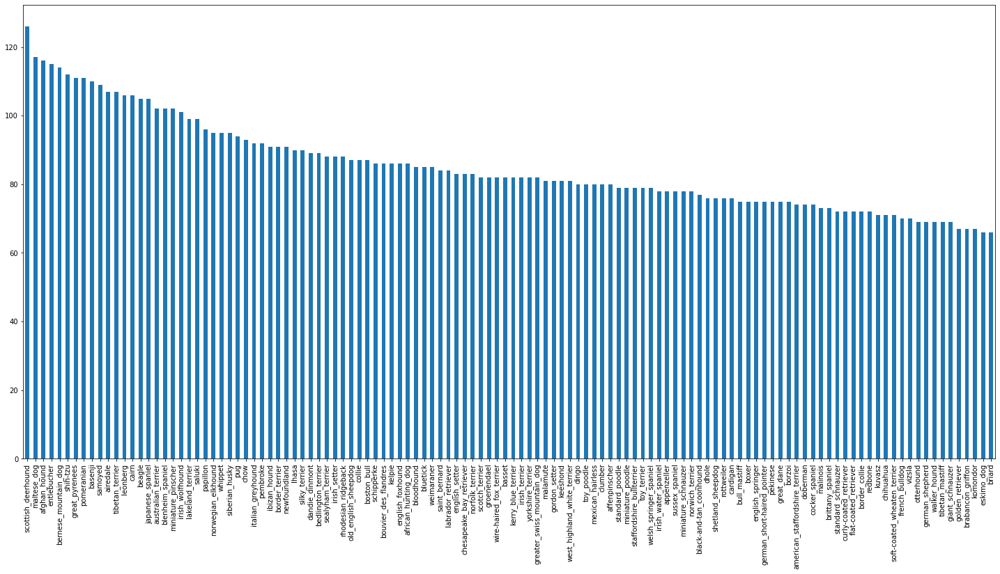

In [ ]:
labels_csv['breed'].value_counts().plot.bar(figsize=(25,12))

In [ ]:
labels_csv['breed'].value_counts().median()

82.0

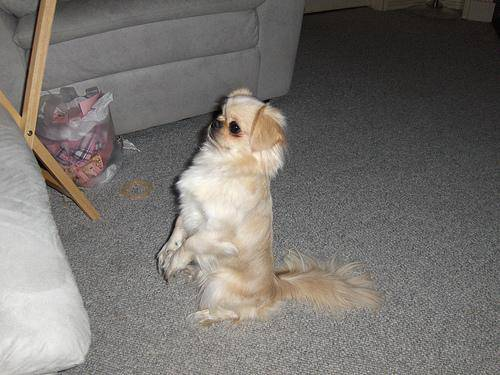

In [ ]:
from IPython.display import Image

Image("drive/My Drive/ML-Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg")

In [ ]:
filenames=["drive/My Drive/ML-Dog Vision/train/"+fname +".jpg" for fname in labels_csv['id']]
filenames[:10]

['drive/My Drive/ML-Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/ML-Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/ML-Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/ML-Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/ML-Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/ML-Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/ML-Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/ML-Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/ML-Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/ML-Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
#check whether the no:of filenames match the actual no:of the image files

import os
print(len(filenames))
print(len(os.listdir("drive/My Drive/ML-Dog Vision/train/")))
if len(os.listdir("drive/My Drive/ML-Dog Vision/train/"))==len(filenames):
  print("Match")
else:
  print("Not Match")

10222
10222
Match


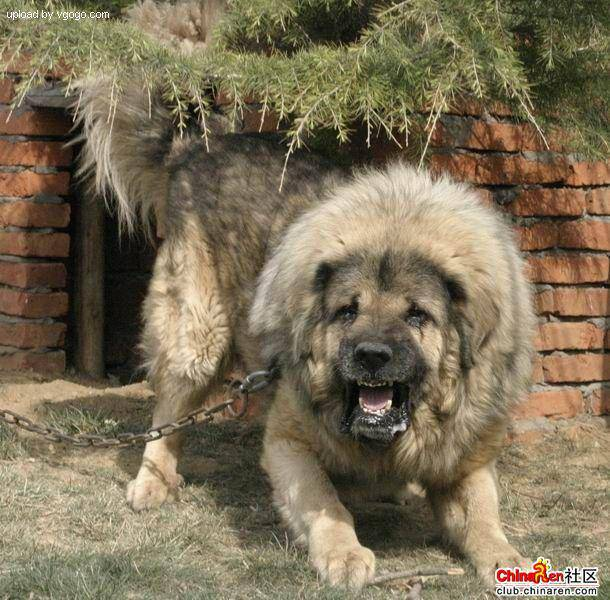

In [ ]:
Image(filenames[9000])

In [ ]:
labels_csv['breed'][9000]

'tibetan_mastiff'

In [ ]:
#preparing the labels

labels=labels_csv['breed'].to_numpy()
# labels=np.array(labels) same as above
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
if len(labels)==len(filenames):
  print("Numbers match")
else:
  print("numbers do not match")

Numbers match


In [ ]:
#find the unique breeds

unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
#convert the labels into boolean labels

boolean_labels=[label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
#what the above code does is it creates an array of booleans checking
#which breed the given label belongs to in the above data in the first array we can find the True
#in the third line

In [ ]:
print(labels[0])
print(np.where(unique_breeds==labels[0])) #gives the index of the
print(boolean_labels[0].argmax())
print(boolean_labels[0].astype(int))

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


Sice we don;t have a vlidation set we're gonna create one

In [ ]:
X=filenames
y=boolean_labels


We're goint to start with 1000 images and increase further if needed.

In [ ]:
NUM_IMAGES=1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
x_train,x_val,y_train,y_val=train_test_split(X[:NUM_IMAGES],y[:NUM_IMAGES],test_size=0.2,random_state=99)

In [ ]:
len(x_train),len(x_val)

(800, 200)

In [ ]:
x_train[:2]

['drive/My Drive/ML-Dog Vision/train/04dea47b883acca9bd57c7ea2930524f.jpg',
 'drive/My Drive/ML-Dog Vision/train/02df8523833c432f90071f86dff69a8f.jpg']

In [ ]:
y_train[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

# Preprocessing the images (turning the images into tensors)



1. Take an image filepathas an input
2.  Use TensorFlow to read the file and save it into a variable `image`.
3. Turn `image` into tensors.
4. Normalize the color channels from 0-255 to 0-1 floats.
4. Resize the image to (225,225)
5. Return the modified image.






 Converting image into into a Tensor

In [ ]:
from matplotlib.pyplot import imread

In [ ]:
image=imread(filenames[99])
image.shape

(378, 500, 3)

In [ ]:
tf.constant(image) #this is a tensor which can be used in gpu

<tf.Tensor: shape=(378, 500, 3), dtype=uint8, numpy=
array([[[ 8, 14, 36],
        [24, 30, 52],
        [ 1,  7, 29],
        ...,
        [ 7, 14, 20],
        [ 7, 14, 20],
        [ 7, 14, 20]],

       [[ 6, 14, 35],
        [34, 40, 62],
        [16, 22, 44],
        ...,
        [ 9, 14, 18],
        [ 9, 14, 18],
        [ 9, 14, 18]],

       [[49, 57, 80],
        [62, 70, 93],
        [31, 39, 62],
        ...,
        [12, 13, 15],
        [12, 13, 15],
        [12, 13, 15]],

       ...,

       [[48, 40, 37],
        [71, 63, 60],
        [60, 52, 49],
        ...,
        [50, 49, 47],
        [51, 50, 48],
        [52, 51, 49]],

       [[50, 40, 38],
        [58, 48, 46],
        [77, 69, 66],
        ...,
        [50, 49, 47],
        [51, 50, 48],
        [52, 51, 49]],

       [[50, 41, 36],
        [51, 42, 37],
        [67, 58, 53],
        ...,
        [50, 49, 47],
        [51, 50, 48],
        [52, 51, 49]]], dtype=uint8)>

In [ ]:
image = tf.io.read_file(filenames[99])
image #this gives image as a tensor string

<tf.Tensor: shape=(), dtype=string, numpy=b'\xff\xd8\xff\xe0\x00\x10JFIF\x00\x01\x01\x00\x00\x01\x00\x01\x00\x00\xff\xdb\x00C\x00\n\x07\x07\x08\x07\x06\n\x08\x08\x08\x0b\n\n\x0b\x0e\x18\x10\x0e\r\r\x0e\x1d\x15\x16\x11\x18#\x1f%$"\x1f"!&+7/&)4)!"0A149;>>>%.DIC<H7=>;\xff\xdb\x00C\x01\n\x0b\x0b\x0e\r\x0e\x1c\x10\x10\x1c;("(;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;;\xff\xc0\x00\x11\x08\x01z\x01\xf4\x03\x01"\x00\x02\x11\x01\x03\x11\x01\xff\xc4\x00\x1f\x00\x00\x01\x05\x01\x01\x01\x01\x01\x01\x00\x00\x00\x00\x00\x00\x00\x00\x01\x02\x03\x04\x05\x06\x07\x08\t\n\x0b\xff\xc4\x00\xb5\x10\x00\x02\x01\x03\x03\x02\x04\x03\x05\x05\x04\x04\x00\x00\x01}\x01\x02\x03\x00\x04\x11\x05\x12!1A\x06\x13Qa\x07"q\x142\x81\x91\xa1\x08#B\xb1\xc1\x15R\xd1\xf0$3br\x82\t\n\x16\x17\x18\x19\x1a%&\'()*456789:CDEFGHIJSTUVWXYZcdefghijstuvwxyz\x83\x84\x85\x86\x87\x88\x89\x8a\x92\x93\x94\x95\x96\x97\x98\x99\x9a\xa2\xa3\xa4\xa5\xa6\xa7\xa8\xa9\xaa\xb2\xb3\xb4\xb5\xb6\xb7\xb8\xb9\xba\xc2\xc3\xc4\xc5\xc6\xc7\xc8\xc9\xca

In [ ]:
image= tf.image.decode_jpeg(image,channels=3)
image #this gives the image as RGB channeled jpeg

<tf.Tensor: shape=(378, 500, 3), dtype=uint8, numpy=
array([[[ 7, 15, 36],
        [23, 31, 52],
        [ 1,  8, 27],
        ...,
        [ 6, 14, 17],
        [ 6, 14, 17],
        [ 6, 14, 17]],

       [[ 5, 13, 34],
        [33, 41, 62],
        [15, 23, 44],
        ...,
        [ 9, 14, 17],
        [ 9, 14, 17],
        [ 9, 14, 17]],

       [[46, 57, 79],
        [60, 71, 93],
        [28, 39, 61],
        ...,
        [10, 14, 13],
        [10, 14, 13],
        [10, 14, 13]],

       ...,

       [[47, 39, 36],
        [71, 63, 60],
        [57, 52, 48],
        ...,
        [50, 49, 45],
        [51, 50, 46],
        [52, 51, 47]],

       [[49, 42, 36],
        [56, 49, 43],
        [77, 70, 64],
        ...,
        [49, 50, 45],
        [50, 51, 46],
        [51, 52, 47]],

       [[48, 41, 35],
        [49, 42, 36],
        [65, 58, 52],
        ...,
        [49, 50, 45],
        [50, 51, 46],
        [51, 52, 47]]], dtype=uint8)>

In [ ]:
# convert the color codes of range 0-255 to 0-1 float values

tf.image.convert_image_dtype(image,tf.float32)

<tf.Tensor: shape=(378, 500, 3), dtype=float32, numpy=
array([[[0.02745098, 0.05882353, 0.14117648],
        [0.09019608, 0.12156864, 0.20392159],
        [0.00392157, 0.03137255, 0.10588236],
        ...,
        [0.02352941, 0.05490196, 0.06666667],
        [0.02352941, 0.05490196, 0.06666667],
        [0.02352941, 0.05490196, 0.06666667]],

       [[0.01960784, 0.0509804 , 0.13333334],
        [0.12941177, 0.16078432, 0.24313727],
        [0.05882353, 0.09019608, 0.17254902],
        ...,
        [0.03529412, 0.05490196, 0.06666667],
        [0.03529412, 0.05490196, 0.06666667],
        [0.03529412, 0.05490196, 0.06666667]],

       [[0.18039216, 0.22352943, 0.30980393],
        [0.23529413, 0.2784314 , 0.3647059 ],
        [0.10980393, 0.15294118, 0.2392157 ],
        ...,
        [0.03921569, 0.05490196, 0.0509804 ],
        [0.03921569, 0.05490196, 0.0509804 ],
        [0.03921569, 0.05490196, 0.0509804 ]],

       ...,

       [[0.18431373, 0.15294118, 0.14117648],
        [0.27

In [ ]:
IMG_SIZE=224

def process_image(image_path):
    """ Takes an image file path as an input and turns the image into a tensor"""

    image = tf.io.read_file(image_path)

    #convert the image into jpg with 3 color channels

    image= tf.image.decode_jpeg(image,channels=3)

    #resize the image

    image=tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

    return image


# Turning our data into batches .Why?

Processing 10000+ images might not be possible as sometimes all the inages may not fit into the memory.

So turning into the batches may help utilize the gpu better and hence we group the data into batches of 32 and this number can be manually adjusted at anytime.

## Inorder to use TennsorGlow effectively we need to use tensor tuples which are of the form `(image,label)`





In [ ]:
def get_image_label(image_path,label):
  """ Takes the image path,label and converts into a tuple with image as a. tensor and its label. Returns a tensor tuple."""
  image=process_image(image_path)
  return image,label

In [ ]:
(process_image(X[99]),tf.constant(y[99]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[ 18.710938 ,  26.710938 ,  47.710938 ],
         [  5.998047 ,  13.341797 ,  32.446148 ],
         [ 13.75307  ,  20.6476   ,  39.6476   ],
         ...,
         [  7.6813602,  12.0527315,  10.0214815],
         [  8.14452  ,  13.734936 ,  15.860224 ],
         [  7.03125  ,  14.       ,  17.       ]],
 
        [[ 54.30971  ,  65.34096  ,  87.40346  ],
         [ 16.417408 ,  27.448658 ,  47.867744 ],
         [ 37.773716 ,  45.867466 ,  66.89872  ],
         ...,
         [  7.7039747,  15.09375  ,   7.9221582],
         [  9.978237 ,  14.816956 ,  11.200352 ],
         [ 10.03125  ,  13.96875  ,  12.882254 ]],
 
        [[ 17.890625 ,  31.328125 ,  56.765625 ],
         [ 54.89956  ,  68.33706  ,  93.77456  ],
         [ 73.20117  ,  84.91992  , 109.79492  ],
         ...,
         [  3.125    ,  15.84375  ,   5.84375  ],
         [  8.693941 ,  13.129456 ,   6.5625   ],
         [ 11.       ,  12.28125  ,   7.351824

106


from_tensors combines the input and returns a dataset with a single element:

 t = tf.constant([[1, 2], [3, 4]])
 ds = tf.data.Dataset.from_tensors(t)
* [x for x in ds]

 [<tf.Tensor: shape=(2, 2), dtype=int32, numpy=array([[1, 2],      [3, 4]], dtype=int32)>]

from_tensor_slices creates a dataset with a separate element for each row of the input tensor:

 t = tf.constant([[1, 2], [3, 4]])
 ds = tf.data.Dataset.from_tensor_slices(t)
 [x for x in ds]
[<tf.Tensor: shape=(2,), dtype=int32, numpy=array([1, 2], dtype=int32)>,
 <tf.Tensor: shape=(2,), dtype=int32, numpy=array([3, 4], dtype=int32)>]

In [ ]:
BATCH_SIZE=32

def create_data_batches(x,y=None,batch_size=BATCH_SIZE,test_data=False,valid_data=False):
        """Creates batches of the desired batch size out of image x and label pairs y
        Shuffles the data if its training data but doesn't shuffle if its testing data
        also accepts test data as inputs
        """
        if test_data:
          print("Creating the test data batches.")
          data=tf.data.Dataset.from_tensor_slices((tf.constant(x)))
          data_batch=data.map(process_image).batch(BATCH_SIZE)
          return data_batch
        elif valid_data:
          print("Creating the validation data batches.")
          data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
          data_batch=data.map(get_image_label).batch(BATCH_SIZE)
          return data_batch
        else:
              print("Creating the train data batches.")
              #turning the filepaths nad labels into tensors
              data=tf.data.Dataset.from_tensor_slices((tf.constant(x),tf.constant(y)))
              #shufflinng the pathnames and labels
              data=data.shuffle(buffer_size=len(x))
              #turning the data into batches
              data_batch=data.map(get_image_label).batch(BATCH_SIZE)
        return data_batch





In [ ]:
#Creating the batches for our train and validation data

train_data=create_data_batches(x_train,y_train)
val_data=create_data_batches(x_val,y_val,valid_data=True)

Creating the train data batches.
Creating the validation data batches.


Now our data is in batches ..but it is difficult to comprehend them so visualize it.

In [ ]:
import matplotlib.pyplot as plt

#create a function to visualze the databatches

def show25img(images,labels):
  """ Displays 25 figures of images"""

  plt.figure(figsize=(11,11))

  for i in range(25):
    ax=plt.subplot(5,5,i+1)

    plt.imshow(images[i].astype(np.uint8))

    plt.title(unique_breeds[labels[i].argmax()])

    plt.axis('off')



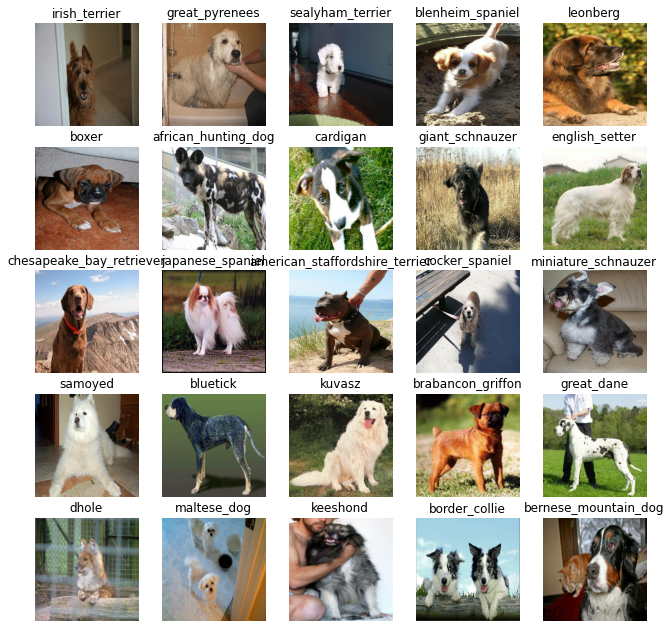

In [ ]:
# to test tthe above func we have to bring some data out of batches

train_images,train_labels= next(train_data.as_numpy_iterator()) #this next gives a iterator to visualize the data we have to unbatch it first

show25img(train_images,train_labels)

# the images change every time we run it because for the train datawe have put a shuffle in the create batches func.


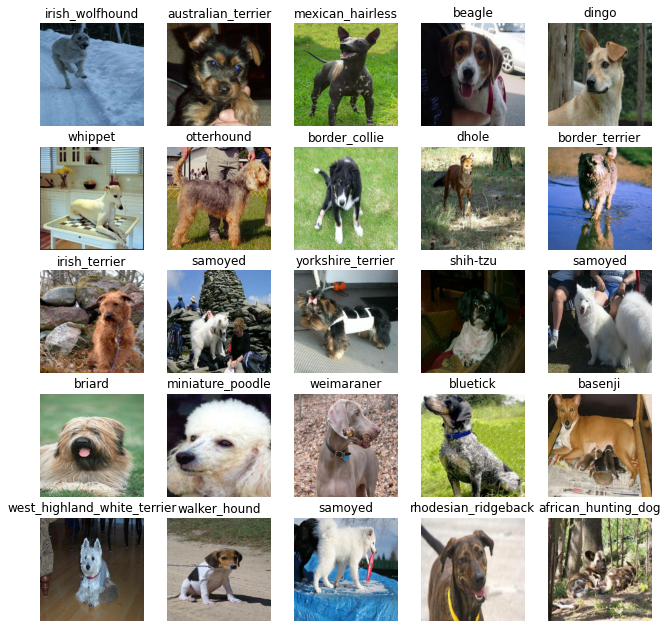

In [ ]:
#try the same for the validation set

val_images,val_labels= next(val_data.as_numpy_iterator()) #this next gives a iterator to visualize the data we have to unbatch it first

show25img(val_images,val_labels)

# the val data does not shuffle so the images are all the same even after u run again

Before training the model we have to make sure of 3 things:
*  Input shape of the data
* Output shape of the data
* URLof the model

In [ ]:
train_data.element_spec  #from this we can see the shapes of input and output.

(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
 TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))

In [ ]:
INPUT_SHAPE=[None,IMG_SIZE,IMG_SIZE,3]  #None , image size, image size , color channels

OUTPUT_SHAPE=len(unique_breeds)

MODEL_URL= 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'


Now create a function which takes input shape and outpu shape

Defines the layers in the keras model in a sequential manner.(do this first ,then this ,then that).

Builds the midel(says it should be evaluated snd improved)

Builds the model(tells the model the input shape it'll be getting)

Returns the model.


In [ ]:
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE,model_url=MODEL_URL):
       print("Building the model with: "+MODEL_URL)

       #setting up the model

       model=tf.keras.Sequential([
           hub.KerasLayer(MODEL_URL), #Layer 1 input layer
           tf.keras.layers.Dense(units=OUTPUT_SHAPE,activation='softmax') #Layer 2 output layer
       ])


       #compile the model

       model.compile(
           loss=tf.keras.losses.CategoricalCrossentropy(),
           optimizer=tf.keras.optimizers.Adam(),
           metrics=['accuracy']
       )

       #Build the model

       model.build(INPUT_SHAPE)

       return model


In [ ]:
model= create_model()
model.summary()

Building the model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


# Creating the Callbacks
* Callbacks are helper functions which a model can use during training to do things such as save the progress and check its progress or stop training if the model does not improve further.
* we'll create two callbacks one for Tensorboard which help us to see the progress of the model and another for the early stopping of the model if the model takes too long to train.

# To setup a tensorboard callback() we need to do 3 things


1.   Load the tensorboard notebook extension
2.   Create a tensorboard callback which is able to save the logs into a directory and pas sit to our model's `fit` function
3. Visualize our model's training logs with the `%tensorboard ` magic function which we will do after training the model




In [ ]:
#Load the tensorboard

%load_ext tensorboard

In [ ]:
# IMPORTANT
import datetime
import os

def create_tensorboard_callback():
       logdir=os.path.join('drive/My Drive/ML-Dog Vision/logs',datetime.datetime.now().
                           strftime("%Y%m%d-%H%M%S"))
       #Make it so the logs get tracked whenever we run the experiment
       return tf.keras.callbacks.TensorBoard(logdir)

In [ ]:
# function to stop overfitting by prventing the model to train when a certain evaluation metric stops improving

early_stopping=tf.keras.callbacks.EarlyStopping(monitor='val_accuracy',patience=5)

# Training a model

Lets create a function to train our model
*   Create a modle using the `create_model` fun
*   Setup the TensorBoard callback
* Call the `fit` func on our model passing it the trainin data and the validatin data and the number of the epochs
* Return the model




In [ ]:
NUM_EPOCHS=100 #@param {type:"slider", min:10,max:100, step:10}

In [ ]:
def train_model():
  """ Trains a given modle and return the trained version"""
  # Create the model
  model=create_model()

  #Create a TensorBoard session everytime we train the model
  tensorboard=create_tensorboard_callback()

  # Fit the mode by passing it the callbacks
  model.fit(x=train_data,epochs=NUM_EPOCHS,validation_data=val_data,validation_freq=1,
            callbacks=[tensorboard,early_stopping])
  return model

In [ ]:
model=train_model()

Building the model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 113s 3s/step - loss: 6.2962 - accuracy: 0.0113 - val_loss: 5.6151 - val_accuracy: 0.0200
Epoch 2/100
25/25 [==============================] - 3s 103ms/step - loss: 4.5943 - accuracy: 0.0587 - val_loss: 5.2521 - val_accuracy: 0.0100
Epoch 3/100
25/25 [==============================] - 3s 104ms/step - loss: 3.8258 - accuracy: 0.1488 - val_loss: 5.4618 - val_accuracy: 0.0100
Epoch 4/100
25/25 [==============================] - 3s 105ms/step - loss: 3.4108 - accuracy: 0.2237 - val_loss: 5.3570 - val_accuracy: 0.0200
Epoch 5/100
25/25 [==============================] - 3s 102ms/step - loss: 2.9437 - accuracy: 0.3325 - val_loss: 5.5244 - val_accuracy: 0.0400
Epoch 6/100
25/25 [==============================] - 3s 102ms/step - loss: 2.6128 - accuracy: 0.3975 - val_loss: 5.5893 - val_accuracy: 0.0150
Epoch 7/100
25/25 [===========================

# Checking the tensorboard logs

In [ ]:
%tensorboard --logdir drive/My\ Drive/ML-Dog\ Vision/logs


<IPython.core.display.Javascript object>

# Making evaluations and predicions using the trained model



In [ ]:
val_data

<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
predictions=model.predict(val_data)
predictions

7/7 [==============================] - 4s 75ms/step


array([[3.8292588e-04, 2.1201506e-05, 1.4335059e-03, ..., 1.7677394e-05,
        1.1273058e-03, 1.4807645e-03],
       [6.5205827e-02, 8.3618361e-04, 3.5806827e-03, ..., 2.5415493e-05,
        3.3360198e-03, 1.8003169e-02],
       [8.1534479e-03, 7.6325345e-03, 2.2728158e-02, ..., 1.4742712e-05,
        1.6192158e-04, 6.0288927e-05],
       ...,
       [4.0458326e-04, 5.4911091e-03, 3.0603615e-04, ..., 1.3154227e-02,
        1.5815103e-04, 4.0855934e-03],
       [6.3527771e-03, 2.1564502e-03, 2.1106424e-02, ..., 6.5579085e-04,
        1.2018029e-03, 1.4753888e-02],
       [8.2606683e-03, 8.4561470e-04, 5.5636372e-03, ..., 8.5865677e-04,
        7.6901552e-04, 1.4992345e-02]], dtype=float32)

In [ ]:
np.sum(predictions[1])

1.0

In [ ]:
index=0

print(predictions[index])
print(f"Max value of predictions is {np.max(predictions[index])}")
print(f"Sum {np.sum(predictions[index])}")
print(f"Max Index {np.argmax(predictions[index])}")
print(f"Predicted Label {unique_breeds[np.argmax(predictions[index])]}")

[3.8292588e-04 2.1201506e-05 1.4335059e-03 3.8822400e-03 1.9577534e-03
 1.7257378e-03 4.9208501e-07 9.0373575e-04 1.4318716e-05 7.7767843e-05
 5.8952835e-04 4.6421628e-05 5.2312069e-04 5.6505570e-04 1.4548608e-04
 8.9988403e-04 3.1663160e-04 1.6103979e-04 2.1059407e-04 4.4772588e-03
 4.5044734e-03 1.0607094e-04 1.9371393e-05 1.7915654e-04 2.0408501e-04
 1.6121421e-02 4.8315720e-04 2.9518345e-04 5.1214203e-05 7.7696651e-04
 9.5236370e-05 1.8460611e-04 1.3853984e-03 1.2498363e-02 8.2792487e-04
 7.0310285e-05 6.1377148e-05 1.5654122e-03 2.8147390e-03 3.9171577e-05
 1.0809690e-03 6.9805878e-08 1.9514920e-03 6.0910726e-01 2.8567510e-03
 2.2533236e-06 3.2510431e-04 4.8705484e-03 1.2622036e-03 2.7788731e-03
 1.2473443e-03 6.3522595e-05 7.5196726e-06 5.1194527e-03 2.9801275e-03
 8.6084660e-03 9.8172678e-03 8.7059283e-04 1.4328279e-03 5.9859371e-03
 3.8078005e-04 8.3971296e-05 1.8237352e-03 2.3397277e-03 7.5815857e-04
 2.7881826e-05 8.4418906e-03 3.2616264e-04 7.4637547e-02 5.7086740e-03
 1.359

In [ ]:
def get_pred_label(prediction_probabilities):
  """ Turns prediction probabilities into a label"""

  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
pred_label=get_pred_label(predictions[0])
pred_label

'eskimo_dog'

In [ ]:
#unbatch the val_data batch to check our prediction

images_=[]
labels_=[]

for image,label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)


In [ ]:
def unbatchify(data):
       """ Takes a batch dataset and returns the images and labels separately"""
       labels_=[]
       images_=[]

       for image,label in data.unbatch().as_numpy_iterator():
            images_.append(image)
            labels_.append(label)
       return images_,labels_

In [ ]:
val_images,val_labels=unbatchify(val_data)
val_images[0],val_labels[0]

(array([[[  2.9639468,   6.963947 ,   7.963947 ],
         [  5.947445 ,  10.677356 ,  13.137177 ],
         [  5.6004467,  13.383928 ,  16.25     ],
         ...,
         [  4.6160717,  10.616072 ,   8.616072 ],
         [  3.6160715,   9.616072 ,   5.6160717],
         [  3.6160715,   9.616072 ,   5.6160717]],
 
        [[  1.4866072,   5.486607 ,   6.486607 ],
         [  4.4598217,   9.189733 ,  11.649554 ],
         [  5.0647326,  12.848214 ,  15.714286 ],
         ...,
         [  6.2164917,  12.216492 ,  10.216492 ],
         [  4.770888 ,  10.770888 ,   8.009092 ],
         [  4.151786 ,  10.151786 ,   6.151786 ]],
 
        [[  3.4062495,   7.4062495,   8.40625  ],
         [  7.109375 ,  11.839286 ,  14.299108 ],
         [  8.352678 ,  16.136162 ,  19.002232 ],
         ...,
         [  8.457564 ,  14.457564 ,  14.457564 ],
         [  5.9709616,  11.970962 ,  10.088265 ],
         [  4.484359 ,  10.484359 ,   8.484359 ]],
 
        ...,
 
        [[117.       , 159.       

In [ ]:
get_pred_label(predictions[0])

'eskimo_dog'

In [ ]:
get_pred_label(val_labels[0])

'irish_wolfhound'

In [ ]:
def plot_pred(prediction_probabilities,imgs,labels,n=1):
      pred_prob,true_label,img=prediction_probabilities[n],labels[n],imgs[n]

      pred_label=get_pred_label(pred_prob)

      plt.imshow(img.astype(np.uint8))

      plt.xticks([])
      plt.yticks([])
      flag=False
      trueLabel=unique_breeds[np.argmax(true_label)]

      if trueLabel==pred_label:
        color='green'
        flag=True
      else:
        color='red'
      plt.title(f" pred: {pred_label} percentage: {np.max(pred_prob)*100:2.0f}% true label: {trueLabel}",color=color)
      return flag


In [ ]:
def find_pred(prediction_probabilities,imgs,labels,n=1):
      pred_prob,true_label,img=prediction_probabilities[n],labels[n],imgs[n]

      pred_label=get_pred_label(pred_prob)


      flag=False
      trueLabel=unique_breeds[np.argmax(true_label)]

      if trueLabel==pred_label:
        flag=True
      return flag,np.max(pred_prob)*100


False

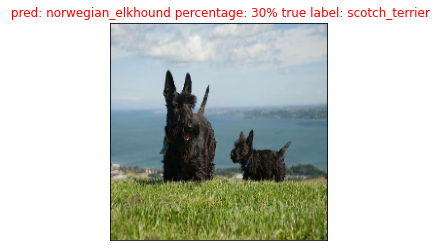

In [ ]:
plot_pred(predictions,val_images,val_labels,n=197)

In [ ]:
arr=[]

for i in range(200):
        a,b=find_pred(predictions,val_images,val_labels,n=i)
        if a==True :
          arr.append(i)



In [ ]:
arr

[82, 117, 121]

False

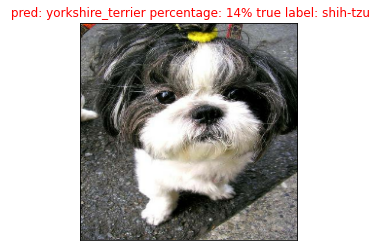

In [ ]:
plot_pred(predictions,val_images,val_labels,n=176)

In [ ]:
print()

In [ ]:
def plot_pred_conf(prediction_probabilities,labels,n=1):
             pred_prob,true_label=prediction_probabilities[n],labels[n]

             pred_label=get_pred_label(pred_prob)

             top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]

             top_10_pred_values=pred_prob[top_10_pred_indexes]

             top_10_pred_labels=unique_breeds[top_10_pred_indexes]

             top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                                                  top_10_pred_values,color='grey')

             true_name= unique_breeds[np.argmax(labels[n])]
             plt.xticks(np.arange(len(top_10_pred_labels)),labels=top_10_pred_labels,rotation='vertical')
             for i in top_10_pred_labels:
               if i==true_name:
                  top_plot[np.argmax(top_10_pred_labels==true_label)].set_color('green')
               else:
                 pass




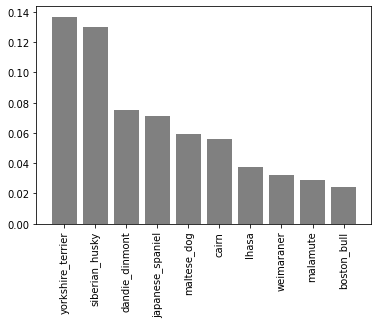

In [ ]:
plot_pred_conf(predictions,val_labels,n=176)

<ipython-input-72-4c1dcb0f08a8>:19: DeprecationWarning: elementwise comparison failed; this will raise an error in the future.
  top_plot[np.argmax(top_10_pred_labels==true_label)].set_color('green')


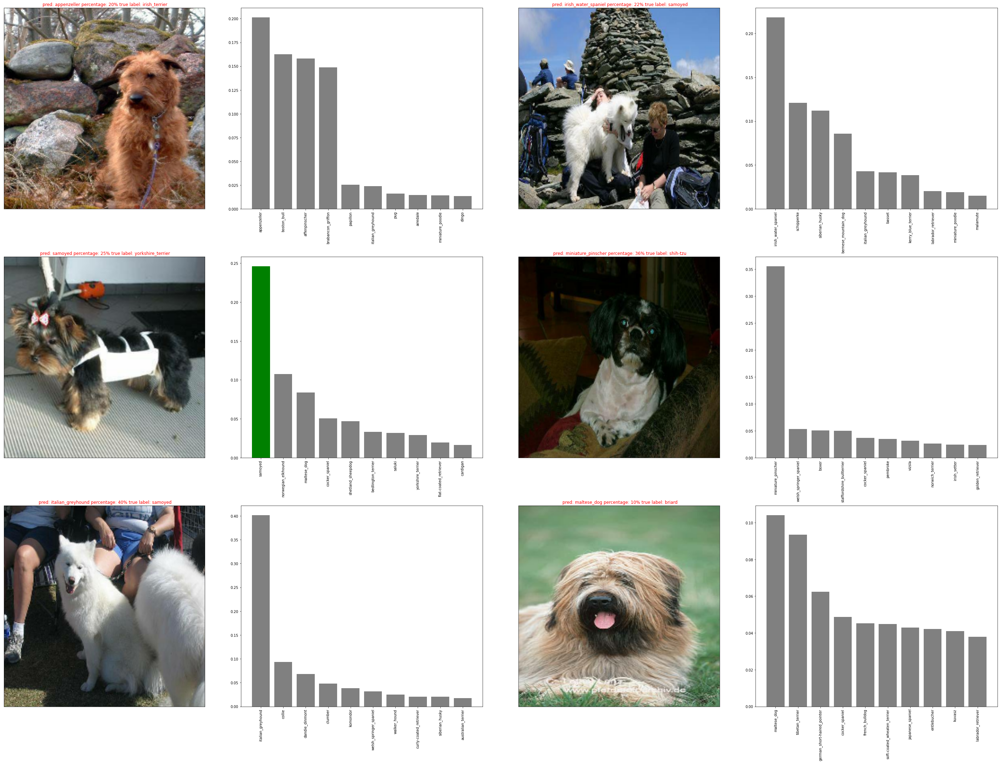

In [ ]:
i_multiplier=10

num_rows=3
num_cols=2
num_images=num_rows*num_cols

plt.figure(figsize=(20*num_cols,10*num_rows))

for i in range(num_images):
        plt.subplot(num_rows,2*num_cols,2*i+1)

        plot_pred(predictions,val_images,val_labels,i+i_multiplier)

        plt.subplot(num_rows,2*num_cols,2*i+2)

        plot_pred_conf(predictions,val_labels,n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()




In [ ]:
#saving the model

def save_model(model,suffix=None):

      model_dir=os.path.join('drive/My Drive/ML-Dog Vision/models',datetime.datetime.now().
                           strftime("%Y%m%d-%H%M%S"))


      model_path=model_dir+'-'+suffix+'.h5'

      print(f"model is savin to {model_path}")

      model.save(model_path)

      return model_path

In [ ]:
def load_model(model_path):

      """Load a saved model"""

      print(f"Loading a saved model from the path {model_path}")

      model=tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})

      return model

In [ ]:
save_model(model,suffix='1000-images-mobilenetv2-Adam')

model is savin to drive/My Drive/ML-Dog Vision/models/20230129-105907-1000-images-mobilenetv2-Adam.h5


'drive/My Drive/ML-Dog Vision/models/20230129-105907-1000-images-mobilenetv2-Adam.h5'

In [ ]:
load_1000_images_model=load_model('drive/My Drive/ML-Dog Vision/models/20230127-201731-1000-images-mobilenetv2-Adam.h5')

Loading a saved model from the path drive/My Drive/ML-Dog Vision/models/20230127-201731-1000-images-mobilenetv2-Adam.h5


In [ ]:
model.evaluate(val_data)

7/7 [==============================] - 1s 61ms/step - loss: 5.9088 - accuracy: 0.0150


[5.9087982177734375, 0.014999999664723873]

In [ ]:
load_1000_images_model.evaluate(val_data) #same as above

7/7 [==============================] - 1s 68ms/step - loss: 5.6124 - accuracy: 0.0300


[5.612358570098877, 0.029999999329447746]

In [ ]:
len(X)

10222

In [ ]:
full_data=create_data_batches(X,y)
full_data

Creating the train data batches.


<BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
full_model=create_model()

Building the model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
full_model_tensorboard=create_tensorboard_callback()

full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor='accuracy',patience=3)

In [ ]:
full_model.fit(x=full_data,epochs=NUM_EPOCHS,callbacks=[full_model_tensorboard,full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 31s 83ms/step - loss: 5.1173 - accuracy: 0.0303
Epoch 2/100
320/320 [==============================] - 28s 88ms/step - loss: 4.4679 - accuracy: 0.0725
Epoch 3/100
320/320 [==============================] - 27s 83ms/step - loss: 4.2035 - accuracy: 0.1055
Epoch 4/100
320/320 [==============================] - 26s 81ms/step - loss: 4.0018 - accuracy: 0.1311
Epoch 5/100
320/320 [==============================] - 26s 81ms/step - loss: 3.8525 - accuracy: 0.1477
Epoch 6/100
320/320 [==============================] - 26s 81ms/step - loss: 3.7447 - accuracy: 0.1663
Epoch 7/100
320/320 [==============================] - 26s 81ms/step - loss: 3.6029 - accuracy: 0.1865
Epoch 8/100
320/320 [==============================] - 26s 80ms/step - loss: 3.5224 - accuracy: 0.1982
Epoch 9/100
320/320 [==============================] - 26s 80ms/step - loss: 3.4408 - accuracy: 0.2133
Epoch 10/100
320/320 [==============================] - 26s 80ms/step - l

In [ ]:
test_path='drive/My Drive/ML-Dog Vision/test/'
test_filenames=[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:9]

['drive/My Drive/ML-Dog Vision/test/e3cfadb2543190f43da6bb5500c75578.jpg',
 'drive/My Drive/ML-Dog Vision/test/ddbdd621e79563a56443a0dd1ee4c48d.jpg',
 'drive/My Drive/ML-Dog Vision/test/e48f3d4f0514a07f4777a30f01d32ea9.jpg',
 'drive/My Drive/ML-Dog Vision/test/e18c30f7ba3680d75ff326ccb71642e0.jpg',
 'drive/My Drive/ML-Dog Vision/test/e0165801e47527205e45295aba441972.jpg',
 'drive/My Drive/ML-Dog Vision/test/e25f28a6c07bf3909c4310b2685f6caf.jpg',
 'drive/My Drive/ML-Dog Vision/test/e7fcdf9671a6593b638cbee42842f981.jpg',
 'drive/My Drive/ML-Dog Vision/test/e288dace85bb7ae95b545066bcbdee60.jpg',
 'drive/My Drive/ML-Dog Vision/test/e6ec1891d8f52a13683c73cabd3045cb.jpg']

In [ ]:
len(test_filenames
    )

10357

In [ ]:
test_data=create_data_batches(test_filenames,test_data=True)

Creating the test data batches.


In [ ]:
test_data

<BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
test_predictions=full_model.predict(test_data)

324/324 [==============================] - 164s 496ms/step


In [ ]:
unique_breeds[test_predictions[0].argmax()]


'pekinese'

In [ ]:
np.savetxt("drive/My Drive/ML-Dog Vision/submitFile.csv",test_predictions,delimiter=',')

In [ ]:
preds_df=pd.DataFrame(columns=['id']+list(unique_breeds))

In [ ]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [ ]:
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]

In [ ]:
preds_df['id']=test_ids

In [ ]:
preds_df

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e3cfadb2543190f43da6bb5500c75578,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,ddbdd621e79563a56443a0dd1ee4c48d,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e48f3d4f0514a07f4777a30f01d32ea9,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e18c30f7ba3680d75ff326ccb71642e0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e0165801e47527205e45295aba441972,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10352,07165cea9be18c57a340345c02a3e885,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10353,0763ebab76bfd9cbfaac696cc604d35e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10354,079e0634a90b3de0e5c799dda0ca8fd3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
10355,08db8163ff5451ae44b7496b5c9ee05a,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
preds_df[list(unique_breeds)]=test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e3cfadb2543190f43da6bb5500c75578,0.001394,0.000169,0.000012,0.018963,0.001062,1.039186e-07,0.000204,0.001330,0.000278,...,0.000550,0.000493,8.375006e-06,0.009058,0.000091,0.000033,0.000073,0.000326,0.000027,4.269514e-03
1,ddbdd621e79563a56443a0dd1ee4c48d,0.124897,0.003235,0.000067,0.000094,0.000038,1.586808e-05,0.000042,0.000012,0.000009,...,0.000073,0.000006,1.560223e-08,0.001461,0.001570,0.000001,0.000051,0.002800,0.102957,5.982175e-07
2,e48f3d4f0514a07f4777a30f01d32ea9,0.134090,0.012470,0.000013,0.000099,0.000013,3.608937e-01,0.000184,0.016891,0.112064,...,0.000022,0.002988,1.863627e-05,0.002971,0.006406,0.000033,0.000226,0.000845,0.000124,1.041554e-05
3,e18c30f7ba3680d75ff326ccb71642e0,0.007351,0.002955,0.000001,0.001592,0.048536,4.430701e-06,0.129647,0.000360,0.006194,...,0.000169,0.000049,9.862011e-07,0.000112,0.000109,0.000136,0.000112,0.018953,0.000149,1.373925e-05
4,e0165801e47527205e45295aba441972,0.003030,0.128731,0.036038,0.003146,0.009431,4.502245e-03,0.003285,0.002675,0.000029,...,0.000310,0.002387,3.629741e-06,0.001628,0.000456,0.000185,0.000066,0.025015,0.048182,3.049146e-03


In [ ]:
preds_df.to_csv('drive/My Drive/ML-Dog Vision/full_model_submission1.csv',index=False)